# Group Project: Mapping Extraction: The Spatial Relationship Between Jails and Data Centers In Los Angeles
## Leila Ullmann
## In this notebook, I will look at indicators of dangerous environmental conditions and map them onto a map of Los Angeles

### Import Data

In [11]:
import pandas as pd
import geopandas as gpd

In [12]:
## Load Data
df = pd.read_csv('EJScreen_2024.csv')

### Preliminary look at the data

In [13]:
df.shape

(2498, 65)

In [14]:
df.head()

,OID_,ID,ST_ABBREV,CNTY_NAME,REGION,ACSTOTPOP,ACSIPOVBAS,ACSEDUCBAS,PEOPCOLOR,PEOPCOLORPCT,...,D2_DWATER,D5_DWATER,AREALAND,AREAWATER,NPL_CNT,TSDF_CNT,EXCEED_COUNT_80,EXCEED_COUNT_80_SUP,Shape_Length,Shape_Area
0,5585,6037101110,CA,Los Angeles County,9,4014,3927,3119,1778,0.442950,...,0.0,0.0,1142401.0,0.0,0,0,0,2,0.047170,0.000112
1,5586,6037101122,CA,Los Angeles County,9,4164,4133,3132,1282,0.307877,...,0.0,0.0,2644045.0,0.0,0,0,0,0,0.096237,0.000259
2,5587,6037101220,CA,Los Angeles County,9,3481,3481,2560,1996,0.573398,...,0.0,0.0,698886.0,0.0,0,0,0,3,0.038499,0.000068
3,5588,6037101221,CA,Los Angeles County,9,3756,3703,2682,1786,0.475506,...,0.0,0.0,354178.0,0.0,0,0,0,4,0.029099,0.000035
4,5589,6037101222,CA,Los Angeles County,9,2808,2808,2090,1531,0.545228,...,0.0,0.0,296512.0,0.0,0,0,1,4,0.030207,0.000029


In [15]:
# look at the data types, verbose = True shows us all the counts
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2498 entries, 0 to 2497
Data columns (total 65 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   OID_                 2498 non-null   int64  
 1   ID                   2498 non-null   int64  
 2   ST_ABBREV            2498 non-null   object 
 3   CNTY_NAME            2498 non-null   object 
 4   REGION               2498 non-null   int64  
 5   ACSTOTPOP            2498 non-null   int64  
 6   ACSIPOVBAS           2498 non-null   int64  
 7   ACSEDUCBAS           2498 non-null   int64  
 8   PEOPCOLOR            2498 non-null   int64  
 9   PEOPCOLORPCT         2498 non-null   float64
 10  LOWINCOME            2498 non-null   int64  
 11  LOWINCPCT            2498 non-null   float64
 12  LESSHS               2498 non-null   int64  
 13  LESSHSPCT            2498 non-null   float64
 14  UNDER5               2498 non-null   int64  
 15  UNDER5PCT            2498 non-null   f

In [16]:
#dtype ensures that the columns are read in as strings for leading zeros
df = pd.read_csv(
    'EJScreen_2024.csv',
    dtype=
    {
        'ID':str
    }
)

In [17]:
# now look at the data again
df.head()

,OID_,ID,ST_ABBREV,CNTY_NAME,REGION,ACSTOTPOP,ACSIPOVBAS,ACSEDUCBAS,PEOPCOLOR,PEOPCOLORPCT,...,D2_DWATER,D5_DWATER,AREALAND,AREAWATER,NPL_CNT,TSDF_CNT,EXCEED_COUNT_80,EXCEED_COUNT_80_SUP,Shape_Length,Shape_Area
0,5585,06037101110,CA,Los Angeles County,9,4014,3927,3119,1778,0.442950,...,0.0,0.0,1142401.0,0.0,0,0,0,2,0.047170,0.000112
1,5586,06037101122,CA,Los Angeles County,9,4164,4133,3132,1282,0.307877,...,0.0,0.0,2644045.0,0.0,0,0,0,0,0.096237,0.000259
2,5587,06037101220,CA,Los Angeles County,9,3481,3481,2560,1996,0.573398,...,0.0,0.0,698886.0,0.0,0,0,0,3,0.038499,0.000068
3,5588,06037101221,CA,Los Angeles County,9,3756,3703,2682,1786,0.475506,...,0.0,0.0,354178.0,0.0,0,0,0,4,0.029099,0.000035
4,5589,06037101222,CA,Los Angeles County,9,2808,2808,2090,1531,0.545228,...,0.0,0.0,296512.0,0.0,0,0,1,4,0.030207,0.000029


In [18]:
# verbose shows all the columns, show_counts shows the number of non-null values
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2498 entries, 0 to 2497
Data columns (total 65 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   OID_                 2498 non-null   int64  
 1   ID                   2498 non-null   object 
 2   ST_ABBREV            2498 non-null   object 
 3   CNTY_NAME            2498 non-null   object 
 4   REGION               2498 non-null   int64  
 5   ACSTOTPOP            2498 non-null   int64  
 6   ACSIPOVBAS           2498 non-null   int64  
 7   ACSEDUCBAS           2498 non-null   int64  
 8   PEOPCOLOR            2498 non-null   int64  
 9   PEOPCOLORPCT         2498 non-null   float64
 10  LOWINCOME            2498 non-null   int64  
 11  LOWINCPCT            2498 non-null   float64
 12  LESSHS               2498 non-null   int64  
 13  LESSHSPCT            2498 non-null   float64
 14  UNDER5               2498 non-null   int64  
 15  UNDER5PCT            2498 non-null   f

### Defining Columns to Keep
#### In this study, we will be looking at a few environmental indicators for hazardous conditions, and also look at a few demographics for the given census tracts. We will be looking at the following columns of data:

Demographic Info:
- ACSTOTPOP: Total Population
- ACSIPOVBAS: Population for whom poverty status is determined
- PEOPCOLORPCT: % people of color
- LOWINCPCT: % low income
- LESSHSPCT: % less than high school education
- UNDER5PCT: % under age 5
- OVER64PCT: % over age 64
- LIFEEXPPCT: % Low Life Expectancy
  
Environmental Indicators: 
- PM25: Particulate Matter 2.5
- RSEI_AIR: Toxic Releases to Air
- PTRAF: Traffic proximity
- PNPL: Superfund proximity
- PRMP: RMP facility proximity
- PTSDF: Hazardous waste proximity
- PWDIS: Wastewater discharge
- DWATER: Drinking Water Non-Compliance


In [20]:
# define columns to keep; you will have to look at your source's metadata to determine which columns to keep and what they mean
columns_to_keep = ['ID',
                   'ACSTOTPOP',
                   'ACSIPOVBAS',
                   'PEOPCOLORPCT',
                   'LOWINCPCT',
                   'LESSHSPCT',
                   'UNDER5PCT',
                   'OVER64PCT',
                   'LIFEEXPPCT',
                   'PM25',
                   'RSEI_AIR',
                   'PTRAF',
                   'PNPL',
                   'PRMP',
                   'PTSDF',
                   'PWDIS',
                   'DWATER']
# add it to a new dataframe
df2 = df[columns_to_keep]

In [21]:
# returns list of columns 
columns = list(df2) # this is the same as df.columns.to_list()
columns

['ID',
 'ACSTOTPOP',
 'ACSIPOVBAS',
 'PEOPCOLORPCT',
 'LOWINCPCT',
 'LESSHSPCT',
 'UNDER5PCT',
 'OVER64PCT',
 'LIFEEXPPCT',
 'PM25',
 'RSEI_AIR',
 'PTRAF',
 'PNPL',
 'PRMP',
 'PTSDF',
 'PWDIS',
 'DWATER']

In [56]:
# Rename the columns
df2.columns = ['FIPS',
'Total Population',
'Population for whom poverty status is determined',
'% people of color',
'% low income',
'% less than high school education',
'% under age 5',
'% over age 64',
'% Low Life Expectancy',
'Particulate Matter 2.5',
'Toxic Releases to Air',
'Traffic proximity',
'Superfund proximity',
'RMP facility proximity',
'Hazardous waste proximity',
'Wastewater discharge',
'Drinking Water Non-Compliance']

In [57]:
df2.sample(5)

,FIPS,Total Population,Population for whom poverty status is determined,% people of color,% low income,% less than high school education,% under age 5,% over age 64,% Low Life Expectancy,Particulate Matter 2.5,Toxic Releases to Air,Traffic proximity,Superfund proximity,RMP facility proximity,Hazardous waste proximity,Wastewater discharge,Drinking Water Non-Compliance
1004,06037272202,3106,3106,0.532196,0.220863,0.107313,0.067289,0.083065,0.187692,11.898455,1002.041473,4.992241e+06,0.000000,0.524918,15.161392,260.376622,0.0
2147,06037604101,4108,4031,0.873905,0.385512,0.325385,0.079114,0.056719,0.164103,12.850295,3518.350979,8.240772e+06,0.371423,2.398949,29.911667,1460.563678,0.0
158,06037120030,2614,2614,0.939556,0.681714,0.431773,0.053558,0.080337,NaN,10.455197,331.125168,4.794924e+06,0.720059,0.802174,26.239777,2074.421025,0.0
1072,06037294610,4021,4021,0.968665,0.378513,0.377689,0.084059,0.135787,0.179487,12.986123,4917.715175,4.071004e+06,0.770736,5.892634,29.861399,8624.764932,0.0
1895,06037553901,6278,6095,0.969417,0.323216,0.320701,0.050653,0.133004,0.195897,14.594064,3797.108601,6.834985e+06,0.708565,1.125901,28.467610,5035.670751,0.0


### Run Simple Plots to Visualize the Data

<Axes: xlabel='% low income', ylabel='Toxic Releases to Air'>

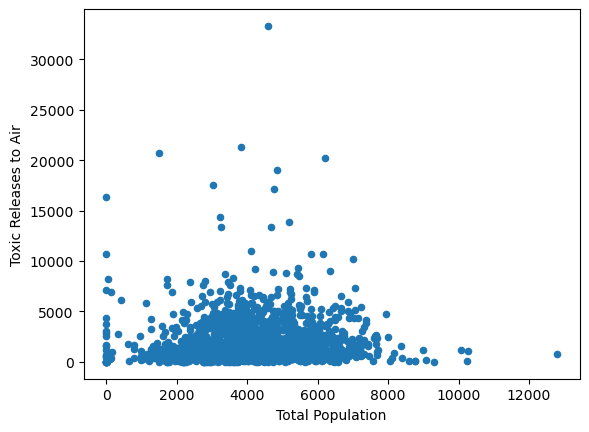

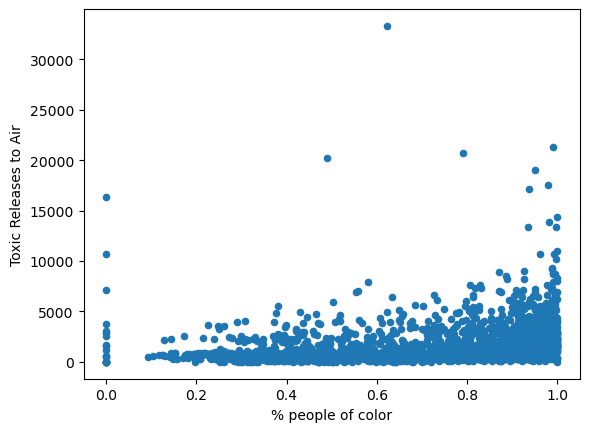

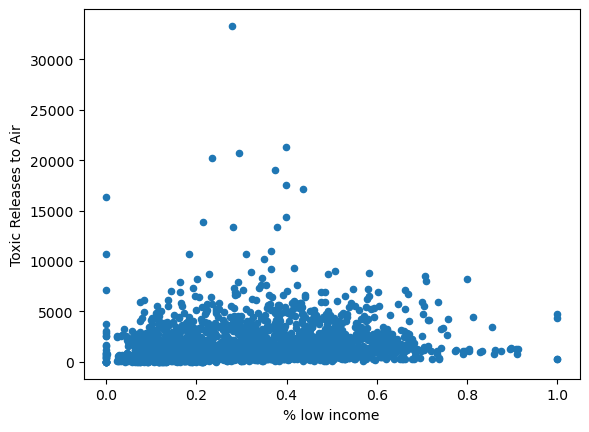

In [27]:
# Scatter plot for toxic releases into the air for total population versus people of color percentage and versus percent low income
df2.plot.scatter(x='Total Population',y='Toxic Releases to Air')
df2.plot.scatter(x='% people of color',y='Toxic Releases to Air')
df2.plot.scatter(x='% low income',y='Toxic Releases to Air')

### Sort the data and make a bar chart for top 10 tracts close to Hazardous waste facilities

In [28]:
df_sorted = df2.sort_values(by='Hazardous waste proximity',ascending = False)

In [29]:
# display the data, but just a few columns to keep it clean
df_sorted[['Census Tract ID','Hazardous waste proximity']].head(10)

,Census Tract ID,Hazardous waste proximity
576,06037204920,46.672422
1052,06037292001,44.216599
578,06037205120,42.679761
1788,06037541603,41.196683
1787,06037541500,40.494027
2483,06037980025,40.004497
595,06037207304,39.369301
2201,06037650901,39.185405
1821,06037543502,39.104033
2126,06037603006,39.031299


<Axes: title={'center': 'Top 10 Census Tracts with Highest Proximity to Hazardous Waste Sites in 2024'}, xlabel='Census Tract ID'>

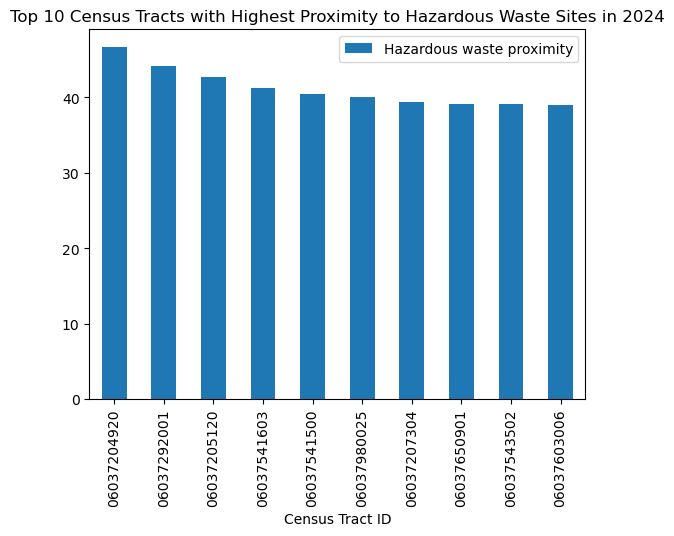

In [76]:
# plot it
df_sorted.head(10).plot.bar(x='Census Tract ID',
                            y='Hazardous waste proximity', 
                            title='Top 10 Census Tracts with Highest Proximity to Hazardous Waste Sites in 2024')

In [37]:
# Now finding the top census tracts with % people of color
df_sorted_lle = df2.sort_values(by='% Low Life Expectancy',ascending = False)

<Axes: title={'center': 'Top 10 Census Tracts with highest percentage of low life expectancy in 2024'}, xlabel='Census Tract ID'>

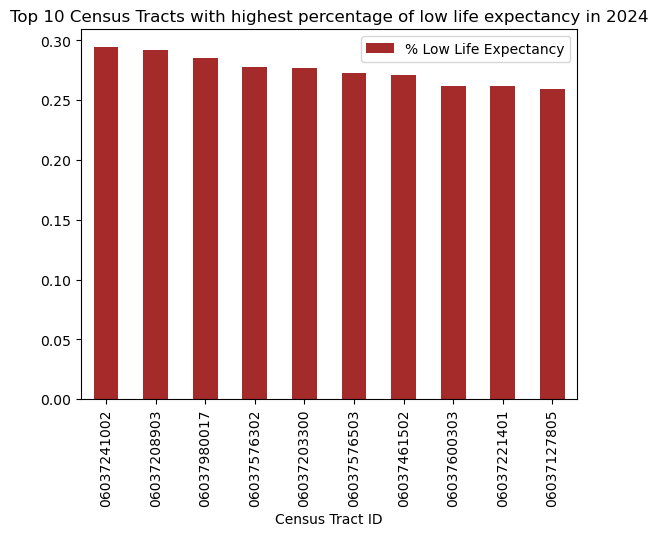

In [38]:
# plot it
df_sorted_lle.head(10).plot.bar(x='Census Tract ID',
                            y='% Low Life Expectancy', 
                            title='Top 10 Census Tracts with highest percentage of low life expectancy in 2024',
                            color= 'brown')

## Mapping Environmental Data

In [39]:
pip install geopandas folium matplotlib

Note: you may need to restart the kernel to use updated packages.


In [40]:
import os
print(os.getcwd())

/home/jovyan/221-final-project/Group Assignments/Environment


In [41]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

In [42]:
tracts=gpd.read_file('Census_Tracts_2020.geojson')

In [43]:
tracts.head()

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2..."
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2..."
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.281 34.25592, -118.28198 34.255..."
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2..."
4,5,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.25405, -118.28594 34.2..."


<Axes: >

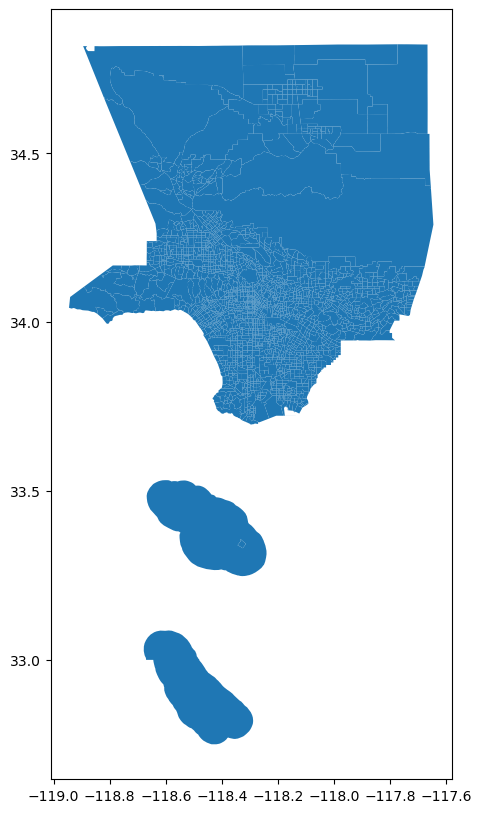

In [44]:
tracts.plot(figsize=(12,10))

In [45]:
tracts.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2495 entries, 0 to 2494
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   OBJECTID       2495 non-null   int32   
 1   CT20           2495 non-null   object  
 2   LABEL          2495 non-null   object  
 3   ShapeSTArea    2495 non-null   float64 
 4   ShapeSTLength  2495 non-null   float64 
 5   geometry       2495 non-null   geometry
dtypes: float64(2), geometry(1), int32(1), object(2)
memory usage: 107.3+ KB


In [46]:
# subset the data
tracts = tracts[['CT20','geometry']]
tracts.head()

,CT20,geometry
0,101110,"POLYGON ((-118.28491 34.25948, -118.28492 34.2..."
1,101122,"POLYGON ((-118.29015 34.27417, -118.29015 34.2..."
2,101220,"POLYGON ((-118.281 34.25592, -118.28198 34.255..."
3,101221,"POLYGON ((-118.28735 34.25591, -118.28863 34.2..."
4,101222,"POLYGON ((-118.28594 34.25405, -118.28594 34.2..."


In [47]:
# create a FIPS column
tracts['FIPS'] ='06' + '037' + tracts['CT20']

/opt/conda/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [48]:
tracts.head()

,CT20,geometry,FIPS
0,101110,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110
1,101122,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122
2,101220,"POLYGON ((-118.281 34.25592, -118.28198 34.255...",06037101220
3,101221,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221
4,101222,"POLYGON ((-118.28594 34.25405, -118.28594 34.2...",06037101222


In [54]:
tracts.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2495 entries, 0 to 2494
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   CT20      2495 non-null   object  
 1   geometry  2495 non-null   geometry
 2   FIPS      2495 non-null   object  
dtypes: geometry(1), object(2)
memory usage: 58.6+ KB


In [55]:
df2.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2498 entries, 0 to 2497
Data columns (total 17 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   Census Tract ID                                   2498 non-null   object 
 1   Total Population                                  2498 non-null   int64  
 2   Population for whom poverty status is determined  2498 non-null   int64  
 3   % people of color                                 2498 non-null   float64
 4   % low income                                      2498 non-null   float64
 5   % less than high school education                 2498 non-null   float64
 6   % under age 5                                     2498 non-null   float64
 7   % over age 64                                     2498 non-null   float64
 8   % Low Life Expectancy                             2345 non-null   float64
 9   Particulate Matter 

In [58]:
# create a new dataframe based on the join
tracts_environment=tracts.merge(df2,on="FIPS")

In [59]:
# what does it look like now?
tracts_environment.head()

,CT20,geometry,FIPS,Total Population,Population for whom poverty status is determined,% people of color,% low income,% less than high school education,% under age 5,% over age 64,% Low Life Expectancy,Particulate Matter 2.5,Toxic Releases to Air,Traffic proximity,Superfund proximity,RMP facility proximity,Hazardous waste proximity,Wastewater discharge,Drinking Water Non-Compliance
0,101110,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110,4014,3927,0.442950,0.228419,0.081757,0.035127,0.209268,0.187692,10.506502,412.030881,1.407128e+06,0.407800,0.108317,3.613111,1270.949378,0.0
1,101122,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122,4164,4133,0.307877,0.125091,0.160920,0.030740,0.218300,0.179487,10.413903,406.773456,1.183865e+06,0.365753,0.103546,3.102089,1154.895830,0.0
2,101220,"POLYGON ((-118.281 34.25592, -118.28198 34.255...",06037101220,3481,3481,0.573398,0.279230,0.232422,0.038782,0.163459,0.194872,10.616187,428.325634,1.798829e+06,0.407586,0.098804,4.406368,1348.198652,0.0
3,101221,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221,3756,3703,0.475506,0.335404,0.258762,0.041001,0.195154,0.153846,10.564279,414.553538,1.677582e+06,0.427932,0.107851,4.260825,1344.972478,0.0
4,101222,"POLYGON ((-118.28594 34.25405, -118.28594 34.2...",06037101222,2808,2808,0.545228,0.413462,0.141148,0.009972,0.163462,0.153846,10.610515,421.390067,1.746322e+06,0.424947,0.103977,4.464596,1366.607824,0.0


<Axes: >

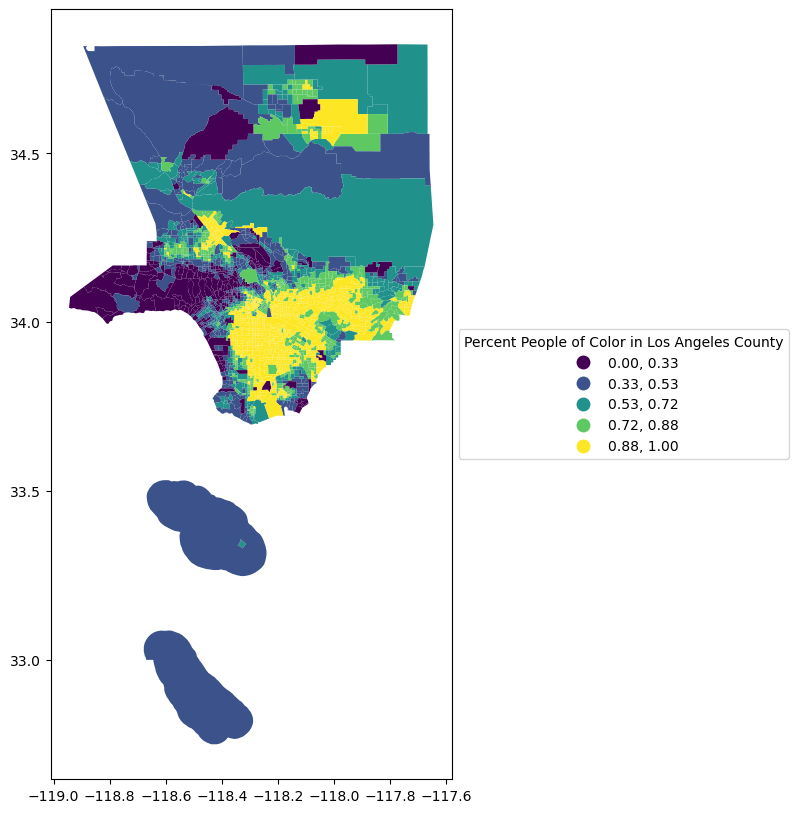

In [86]:
# mapping percent people of color
tracts_environment.plot(figsize=(12,10),
                 column='% people of color',
                 legend=True, 
                 scheme='NaturalBreaks',
                legend_kwds={'loc': 'center left', 'title': 'Percent People of Color in Los Angeles County', 'bbox_to_anchor':(1,0.5)})

{<Axes: >}

<Axes: >

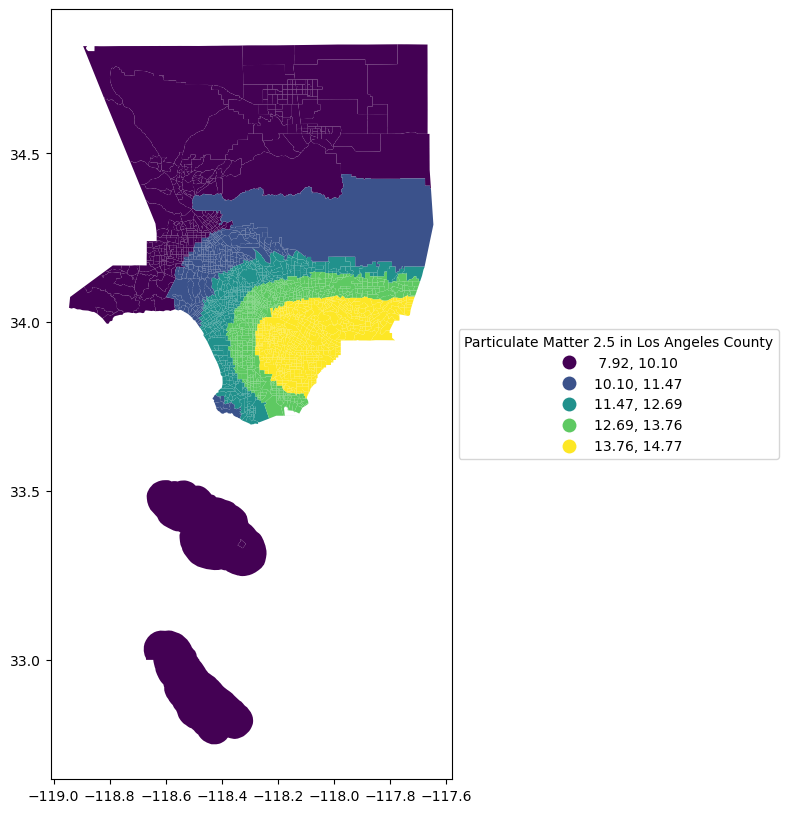

In [62]:
# mapping Particulate Matter 2.5
tracts_environment.plot(figsize=(12,10),
                 column='Particulate Matter 2.5',
                 legend=True, 
                 scheme='NaturalBreaks',
                legend_kwds={'loc': 'center left', 'title': 'Particulate Matter 2.5 in Los Angeles County', 'bbox_to_anchor':(1,0.5)})

<Axes: >

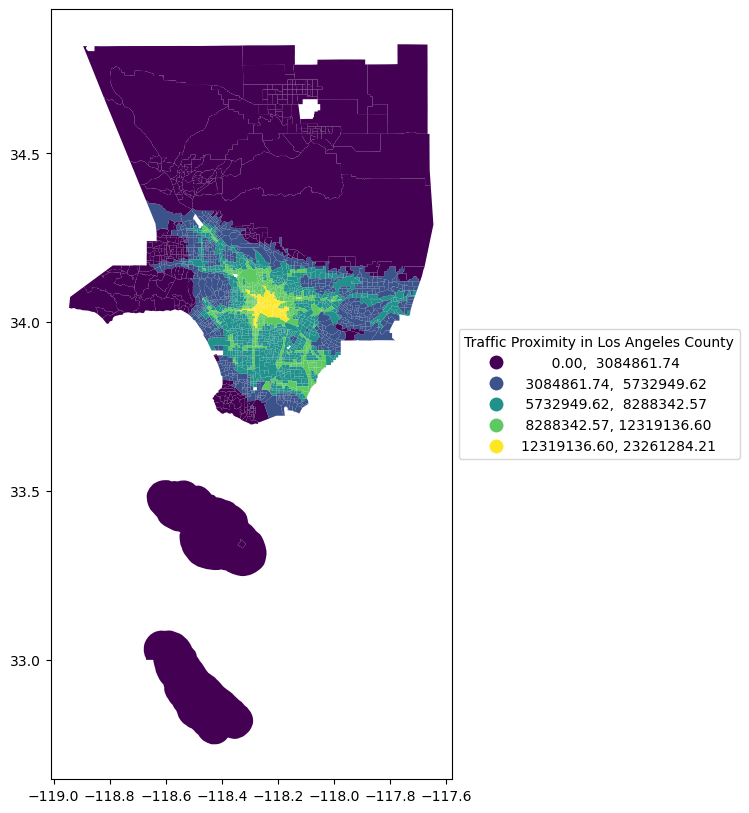

In [63]:
# mapping Traffic Proximity
tracts_environment.plot(figsize=(12,10),
                 column='Traffic proximity',
                 legend=True, 
                 scheme='NaturalBreaks',
                legend_kwds={'loc': 'center left', 'title': 'Traffic Proximity in Los Angeles County', 'bbox_to_anchor':(1,0.5)})

<Axes: >

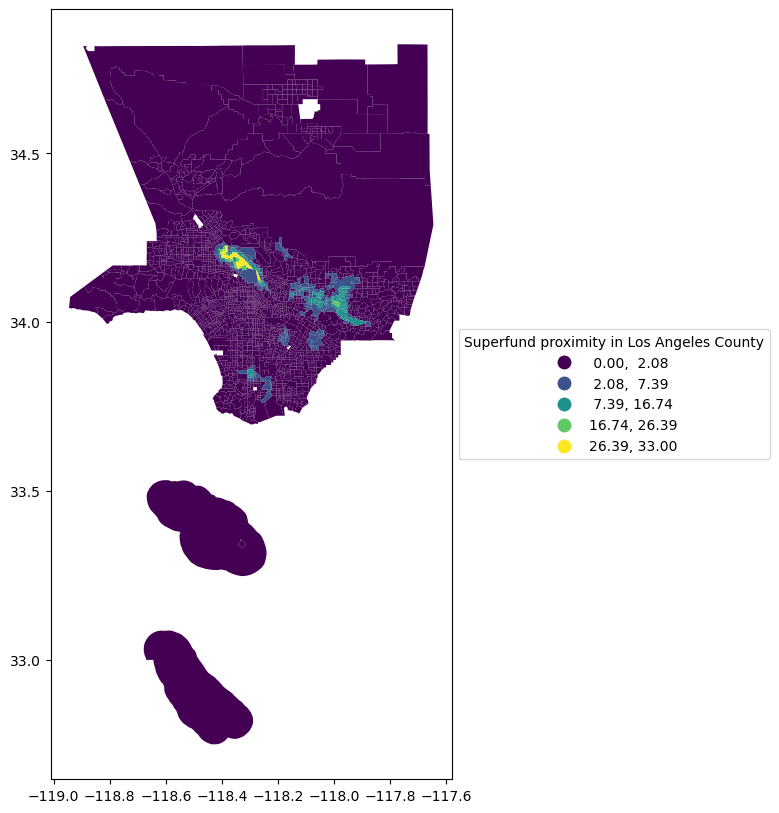

In [64]:
# mapping Superfund proximity
tracts_environment.plot(figsize=(12,10),
                 column='Superfund proximity',
                 legend=True, 
                 scheme='NaturalBreaks',
                legend_kwds={'loc': 'center left', 'title': 'Superfund proximity in Los Angeles County', 'bbox_to_anchor':(1,0.5)})

<Axes: >

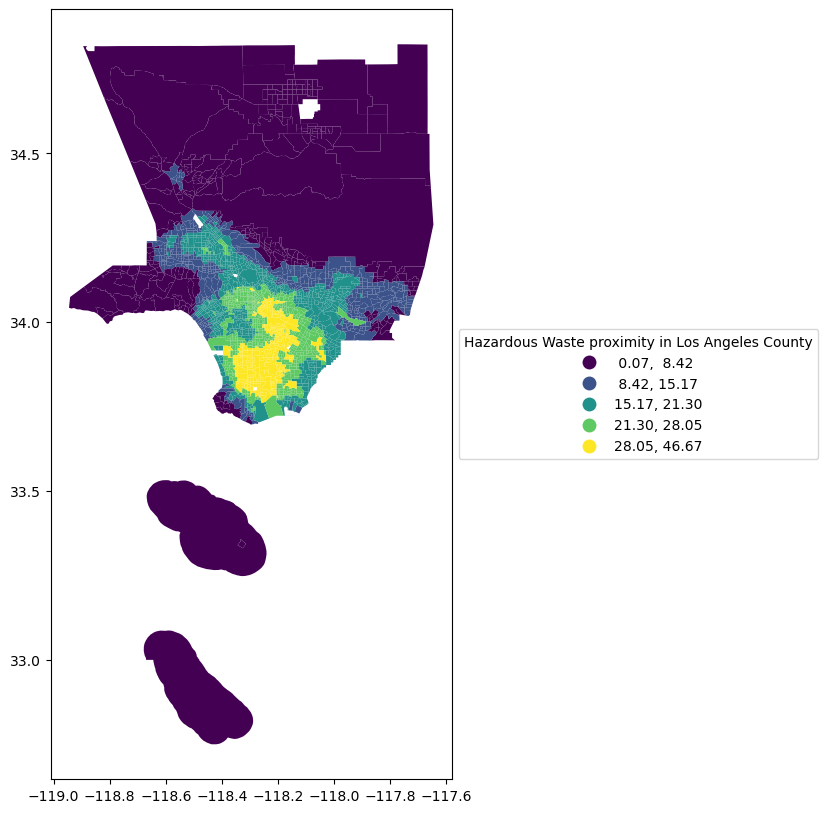

In [68]:
# mapping Hazardous Waste proximity
tracts_environment.plot(figsize=(12,10),
                 column='Hazardous waste proximity',
                 legend=True, 
                 scheme='NaturalBreaks',
                legend_kwds={'loc': 'center left', 'title': 'Hazardous Waste proximity in Los Angeles County', 'bbox_to_anchor':(1,0.5)})

<Axes: >

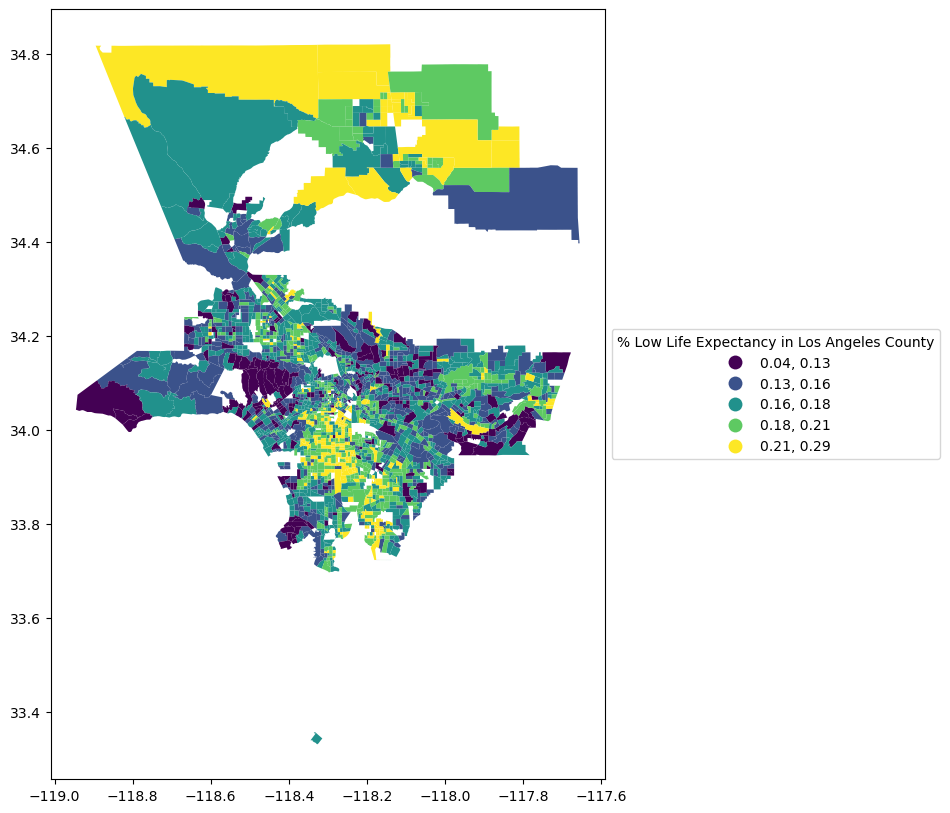

In [69]:
# mapping % Low Life Expectancy
tracts_environment.plot(figsize=(12,10),
                 column='% Low Life Expectancy',
                 legend=True, 
                 scheme='NaturalBreaks',
                legend_kwds={'loc': 'center left', 'title': '% Low Life Expectancy in Los Angeles County', 'bbox_to_anchor':(1,0.5)})

### It is clear from these maps that poor environmental conditions are clustered in similar areas as the Million Dollar Hoods, as well as areas with a higher percentage of people of color and higher percentage of low life expectancy.

In [87]:
import folium 

In [89]:
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  geo_data=tracts_environment, # geo data
                  data=tracts_environment, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'Hazardous waste proximity'], # [key, value]
                  fill_color='BuPu',
    name = 'Hazardous waste proximity',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Hazardous waste proximity (2024)').add_to(m)    # name on the legend color bar
m

In [90]:
m.save('hazardous_waste.html')